In [0]:
%matplotlib inline
import os
import pandas as pd, numpy as np
import matplotlib.pyplot as plt
from skimage.io import imread
import seaborn as sns # nice visuals
from sklearn.model_selection import train_test_split # splitting data
from matplotlib.patches import Rectangle
import pydicom
# quantifying models
from sklearn.metrics import accuracy_score, classification_report, roc_curve, roc_auc_score, confusion_matrix
training_scale_factor = 2 # how much did we scale the images for training
DCM_TAG_LIST = ['PatientAge', 'ViewPosition', 'PatientSex']
data_dir = '../input/pneumonia-texture-analysis/'
data_dir = '../input/rsna-texture-analysis-2018-dataset/'


In [0]:
def categories_to_indicators(in_df):
    new_df = in_df.copy()
    new_df['IsMale'] = in_df['PatientSex'].map(lambda x: 'M' in x).astype(float)
    new_df['IsAP'] = in_df['ViewPosition'].map(lambda x: 'AP' in x).astype(float)
    return new_df.drop(['PatientSex', 'ViewPosition'], axis=1)
full_train_df = categories_to_indicators(pd.read_csv(os.path.join(data_dir, 'train_all.csv')))
full_train_stack = imread(os.path.join(data_dir, 'train.tif'))
full_train_df.sample(5)

,tile_id,slice_idx,PatientAge,opacity_prior,opacity,IsMale,IsAP
2256,tile_2256_287_347,2256,30,1.649122e-05,1,1.0,1.0
1225,tile_1225_328_336,1225,63,1.338190e-05,0,1.0,1.0
2091,tile_2091_35_107,2091,33,1.514693e-07,0,0.0,1.0
659,tile_659_136_140,659,48,7.003353e-06,0,1.0,0.0
2265,tile_2265_243_171,2265,64,1.677102e-05,1,1.0,0.0


In [0]:
from sklearn.preprocessing import RobustScaler
from sklearn.pipeline import make_pipeline

def fit_and_score(in_model, full_features, full_labels, rescale=True):
    """
    Take a given model, set of features, and labels
    Break the dataset into training and validation
    Fit the model
    Show how well the model worked
    """
    train_feat, valid_feat, train_lab, valid_lab = train_test_split(full_features, 
                                                                    full_labels,
                                                                    test_size=0.25,
                                                                    random_state=2018)
    
    if rescale:
        feature_scaler = RobustScaler()
        train_feat = feature_scaler.fit_transform(train_feat)
        valid_feat = feature_scaler.transform(valid_feat)
    in_model.fit(train_feat, train_lab)
    predictions = in_model.predict_proba(valid_feat)[:, 1]
    predicted_class = predictions>0.5
    tpr, fpr, _ = roc_curve(valid_lab, predictions)
    auc = roc_auc_score(valid_lab, predictions)
    print(classification_report(valid_lab, predicted_class))
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))
    ax1.plot(tpr, fpr, 'r.-', label='Prediction (AUC:{:2.2f})'.format(auc))
    ax1.plot(tpr, tpr, 'k-', label='Random Guessing')
    ax1.legend()
    ax1.set_title('ROC Curve')
    sns.heatmap(confusion_matrix(valid_lab, predicted_class), 
                annot=True, fmt='4d', ax=ax2)
    ax2.set_xlabel('Prediction')
    ax2.set_ylabel('Actual Value')
    ax2.set_title('Confusion Matrix ({:.1%})'.format(accuracy_score(valid_lab, predicted_class)))
    return make_pipeline(feature_scaler, in_model)

In [0]:
# add the intensity channels
full_train_df['Mean_Intensity'] = np.mean(full_train_stack, (1, 2))
full_train_df['Std_Intensity'] = np.std(full_train_stack, (1, 2))

/opt/conda/lib/python3.6/site-packages/sklearn/svm/base.py:196: FutureWarning: The default value of gamma will change from 'auto' to 'scale' in version 0.22 to account better for unscaled features. Set gamma explicitly to 'auto' or 'scale' to avoid this warning.
  "avoid this warning.", FutureWarning)


              precision    recall  f1-score   support

           0       0.83      0.78      0.81       409
           1       0.79      0.83      0.81       396

   micro avg       0.81      0.81      0.81       805
   macro avg       0.81      0.81      0.81       805
weighted avg       0.81      0.81      0.81       805



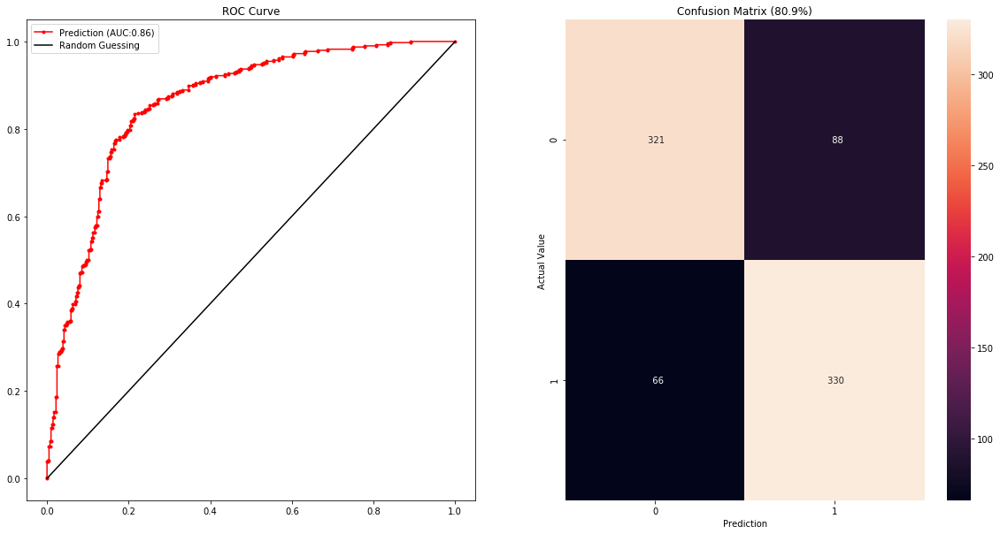

In [0]:
from sklearn.svm import SVC
svm_model = SVC(probability=True)
model_cols = ['PatientAge', 'opacity_prior', 'IsMale', 'IsAP', 
                   'Mean_Intensity', 'Std_Intensity']
fitted_pipeline = fit_and_score(
    svm_model,
    full_train_df[model_cols].values,
    full_train_df['opacity']
)

# Load Real Competition Data


In [0]:
comp_dir = '../input/rsna-pneumonia-detection-challenge/'
comp_img_dir = os.path.join(comp_dir, 'stage_2_train_images')
rc_train_df = pd.read_csv(os.path.join(comp_dir, 'stage_2_train_labels.csv'))
rc_train_df['path'] = rc_train_df['patientId'].map(lambda x: os.path.join(comp_img_dir, '{}.dcm'.format(x)))
rc_train_df.sample(3)

,patientId,x,y,width,height,Target,path
22473,cb267a1f-a786-4e14-a278-898c30a5a4f2,NaN,NaN,NaN,NaN,0,../input/rsna-pneumonia-detection-challenge/st...
6437,4eea8e3e-6760-416e-b236-34b192866578,NaN,NaN,NaN,NaN,0,../input/rsna-pneumonia-detection-challenge/st...
11383,766d3d32-c4a5-4318-a1a9-4db74ef0de80,NaN,NaN,NaN,NaN,0,../input/rsna-pneumonia-detection-challenge/st...


In [0]:
sort_width_df = rc_train_df.\
    groupby('patientId').\
    agg({'width': 'sum'}).\
    reset_index().\
    sort_values('width', ascending=False)
big_box = sort_width_df.iloc[0, 0] # first (biggest total width)
no_box = sort_width_df.iloc[-1, 0] # last (smallest total width)
pneu_pat_df = rc_train_df[rc_train_df['patientId']==big_box]
healthy_pat_df = rc_train_df[rc_train_df['patientId']==no_box]

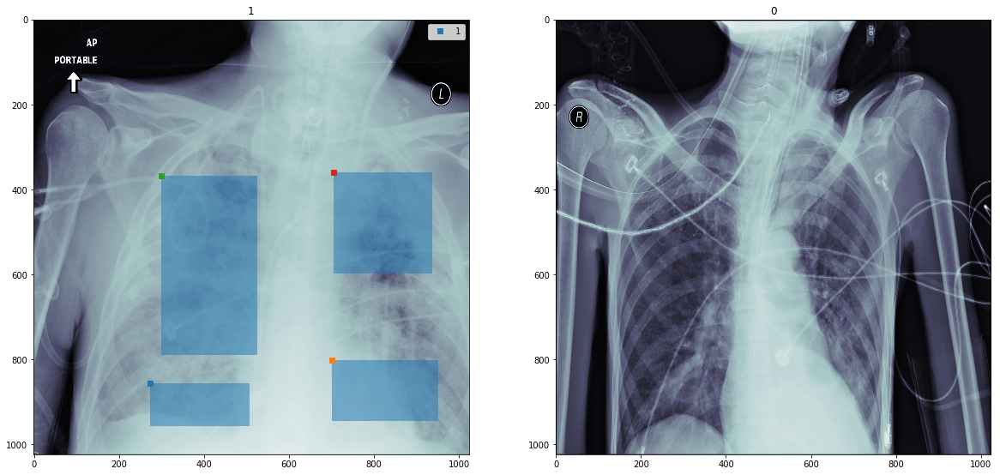

In [0]:
fig, m_axs = plt.subplots(1, 2, figsize = (20, 10))
sample_df = pd.concat([pneu_pat_df, healthy_pat_df])
for c_ax, (c_path, c_rows) in zip(m_axs.flatten(),
                    sample_df.groupby(['path'])):
    c_dicom = pydicom.read_file(c_path)
    c_ax.imshow(c_dicom.pixel_array, cmap='bone')
    c_ax.set_title('{Target}'.format(**c_rows.iloc[0,:]))
    for i, (_, c_row) in enumerate(c_rows.dropna().iterrows()):
        c_ax.plot(c_row['x'], c_row['y'], 's', label='{Target}'.format(**c_row))
        c_ax.add_patch(Rectangle(xy=(c_row['x'], c_row['y']),
                                width=c_row['width'],
                                height=c_row['height'], 
                                 alpha = 0.5))
        if i==0: c_ax.legend()

In [0]:
step_x = full_train_stack.shape[1]*2
step_y = full_train_stack.shape[2]*2
overlap = False
if overlap:
    x_steps = np.arange(0, 1024, step_x/2, dtype=int)[1:]
    y_steps = np.arange(0, 1024, step_y/2, dtype=int)[1:]
else:
    x_steps = np.arange(0, 1024, step_x, dtype=int)+step_x//2
    y_steps = np.arange(0, 1024, step_y, dtype=int)+step_x//2
from scipy.ndimage import zoom
opacity_prior_map = zoom(imread(os.path.join(data_dir, 'opacity_prior.tif')), 
                         (training_scale_factor, training_scale_factor),
                        order=0)
def dicom_to_tiles(c_path):
    c_dicom = pydicom.read_file(c_path)
    img_rows = []
    tag_dict = {c_tag: getattr(c_dicom, c_tag, '') for c_tag in DCM_TAG_LIST}
    for x in x_steps:
        for y in y_steps:
            img_rows += [{'x': x, 'y': y, 
                          'img': c_dicom.pixel_array[y-step_y//2:y+step_y//2, x-step_x//2:x+step_x//2],
                          'opacity_prior': np.mean(opacity_prior_map[y-step_y//2:y+step_y//2, x-step_x//2:x+step_x//2]),
                         **tag_dict}]
    out_df = categories_to_indicators(pd.DataFrame(img_rows))
    # add the intensity channels
    out_df['Mean_Intensity'] = out_df['img'].map(np.mean)
    out_df['Std_Intensity'] = out_df['img'].map(np.std)
    out_df['prediction'] = fitted_pipeline.predict_proba(out_df[model_cols])[:,1]
    return out_df

In [0]:
PREDICTION_CUTOFF = 0.5 # how good a prediction needs to be for us to keep it

In [0]:
test_img_path = pneu_pat_df.iloc[0,-1]
test_img_tiles_df = dicom_to_tiles(test_img_path)
print(test_img_tiles_df.shape[0], 'predictions')
test_img_tiles_df.sample(2)

64 predictions


,PatientAge,img,opacity_prior,x,y,IsMale,IsAP,Mean_Intensity,Std_Intensity,prediction
57,46,"[[4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4,...",1.651935e-07,960,192,1.0,1.0,92.521912,72.136087,0.236751
49,46,"[[186, 185, 185, 185, 186, 187, 187, 186, 186,...",1.719762e-06,832,192,1.0,1.0,161.028809,31.442231,0.095403


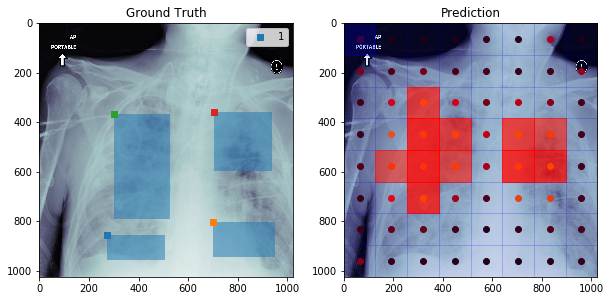

In [0]:
from matplotlib import animation, rc
rc('animation', html='jshtml', embed_limit=100)
fig, (ax1, ax2) = plt.subplots(1, 2, figsize = (10, 5))
c_dicom = pydicom.read_file(test_img_path)
ax1.imshow(c_dicom.pixel_array, cmap='bone')
ax1.set_title('Ground Truth')
for i, (_, c_row) in enumerate(pneu_pat_df.dropna().iterrows()):
    ax1.plot(c_row['x'], c_row['y'], 's', label='{Target}'.format(**c_row))
    ax1.add_patch(Rectangle(xy=(c_row['x'], c_row['y']),
                            width=c_row['width'],
                            height=c_row['height'], 
                             alpha = 0.5))
    if i==0: ax1.legend()

ax2.imshow(c_dicom.pixel_array, cmap='bone')
ax2.set_title('Prediction')
ax2.set_xlim(0, 1024)
ax2.set_ylim(1024, 0)
point_list = list(test_img_tiles_df.sort_values(['x', 'y']).dropna().iterrows())

def add_point(i):
    _, c_row = point_list[i]
    c_color = plt.cm.hot(np.array([c_row['prediction']]))
    artists = [ax2.scatter(c_row['x'], 
                        c_row['y'],
                           c=c_color
                       )]
    artists += [ax2.add_patch(Rectangle(
        xy=(c_row['x']-step_x//2,
            c_row['y']-step_y//2),
        width=step_x,
        height=step_y, 
        color='red' if c_row['prediction']>PREDICTION_CUTOFF else 'blue',
        alpha=c_row['prediction'] if c_row['prediction']>PREDICTION_CUTOFF else 0.1))]
    return tuple(artists)
ani = animation.FuncAnimation(fig, add_point, range(len(point_list)), interval=50)
ani

In [0]:
from IPython.display import HTML
# reset the axes
ax2.cla()
ax2.imshow(c_dicom.pixel_array, cmap='bone')
ax2.set_xlim(0, 1024)
ax2.set_ylim(1024, 0)
ax2.set_title('Prediction')
ani.save('step_by_step_prediction.gif', writer='imagemagick')
HTML('<img src="step_by_step_prediction.gif"/>')

# Try the Healthy Patient

In [0]:
test_img_path = healthy_pat_df.iloc[0,-1]
test_img_tiles_df = dicom_to_tiles(test_img_path)
test_img_tiles_df.sample(2)

,PatientAge,img,opacity_prior,x,y,IsMale,IsAP,Mean_Intensity,Std_Intensity,prediction
7,45,"[[1, 38, 127, 119, 117, 115, 118, 119, 120, 11...",3.088431e-08,64,960,1.0,1.0,57.386536,46.128109,0.108997
45,45,"[[113, 111, 108, 104, 101, 99, 95, 92, 93, 95,...",1.092335e-05,704,704,1.0,1.0,108.087402,19.067432,0.696339


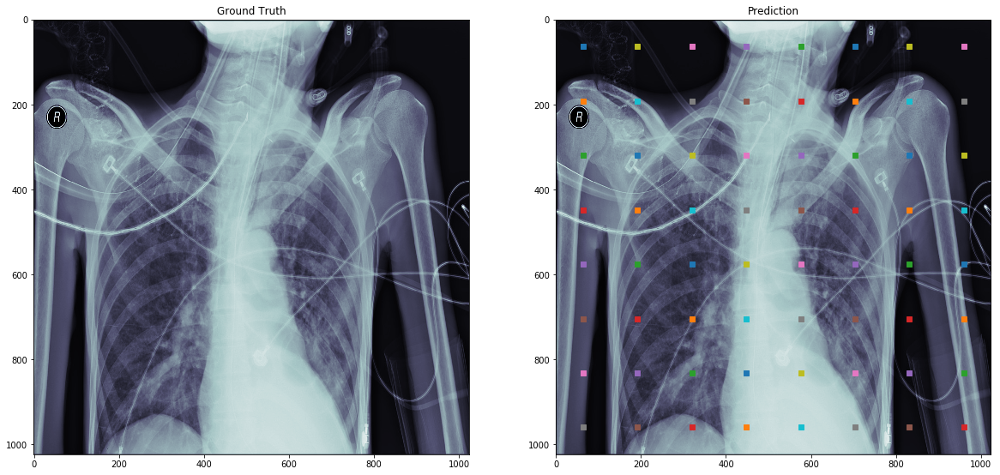

In [0]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize = (20, 10))
c_dicom = pydicom.read_file(test_img_path)
ax1.imshow(c_dicom.pixel_array, cmap='bone')
ax1.set_title('Ground Truth')
for i, (_, c_row) in enumerate(healthy_pat_df.dropna().iterrows()):
    ax1.plot(c_row['x'], c_row['y'], 's', label='{Target}'.format(**c_row))
    ax1.add_patch(Rectangle(xy=(c_row['x'], c_row['y']),
                            width=c_row['width'],
                            height=c_row['height'], 
                             alpha = 0.5))
    if i==0: ax1.legend()

ax2.imshow(c_dicom.pixel_array, cmap='bone')
ax2.set_title('Prediction')
for i, (_, c_row) in enumerate(test_img_tiles_df.dropna().iterrows()):
    ax2.plot(c_row['x'], c_row['y'], 's', label='{prediction:.1%}'.format(**c_row))
    if c_row['prediction']>0.75:
        ax2.add_patch(Rectangle(xy=(c_row['x']-step_x//2, 
                                    c_row['y']-step_y//2),
                                width=step_x,
                                height=step_y, 
                                 alpha = c_row['prediction']/2))

## Everything seems good
The model seems to work, we get many more predictions for the sick patient than the healthy patient we can now try to run all of the test data and see what happens

# Running everything
We can now run the predictions on all of the images

In [0]:
from glob import glob
from tqdm import tqdm_notebook
all_test_images = glob(os.path.join(comp_dir, 'stage_2_test_images', '*.dcm'))
all_predictions_list = {}
for c_path in tqdm_notebook(all_test_images):
    patient_id = os.path.splitext(os.path.basename(c_path))[0]
    # keep only good predictions and remove the image column
    all_predictions_list[patient_id] = dicom_to_tiles(c_path).\
        query('prediction>{}'.format(PREDICTION_CUTOFF)).\
        drop(['img'],1) 

In [0]:
def pkg_result_string(in_df):
    out_list = in_df[['prediction', 'x', 'y']].apply(lambda c_row: 
                                                     '%2.2f %d %d %d %d' % (c_row['prediction'], 
                                                                          c_row['x']-step_x//2,
                                                                          c_row['y']-step_y//2,
                                                                          step_x, 
                                                                          step_y), 1).values.tolist()
    return ' '.join(out_list)
#pkg_result_string(all_predictions_list['2d5d8ecc-3ee3-4c9b-bb86-3f614a079585'])

In [0]:
submission_df = pd.DataFrame({'patientId': list(all_predictions_list.keys())})

In [0]:
submission_df['PredictionString'] = submission_df['patientId'].\
    map(lambda x: pkg_result_string(all_predictions_list[x]))
submission_df.sample(3)

,patientId,PredictionString
2672,30388b30-3486-4269-b050-2f48d973e358,0.82 256 384 128 128 0.87 256 512 128 128 0.65...
646,30a4932f-d7b3-4727-b0bc-72605b530913,0.62 128 384 128 128 0.64 128 512 128 128 0.91...
399,28e7948f-0d76-4616-80e0-7e54f8691d43,0.62 256 384 128 128 0.80 256 512 128 128 0.60...


In [0]:
submission_df.to_csv('submission_rsna_competition.csv', index=False)